First example of running Nimble from the nimble.org website. Bivariate normal distribution.

In [15]:
library(nimble)

In [16]:
myBUGScode <- nimbleCode({mu ~ dnorm(0, sd = 100) 
                          sigma ~ dunif(0, 100) 
                          for(i in 1:10) y[i] ~ dnorm(mu, sd = sigma)})

In [17]:
myModel <- nimbleModel(myBUGScode)

defining model...
building model...
running calculate on model (any error reports that follow may simply reflect missing values in model variables) ... 
checking model sizes and dimensions... note that missing values (NAs) or non-finite values were found in model variables: mu, sigma, y. This is not an error, but some or all variables may need to be initialized for certain algorithms to operate properly.
model building finished.


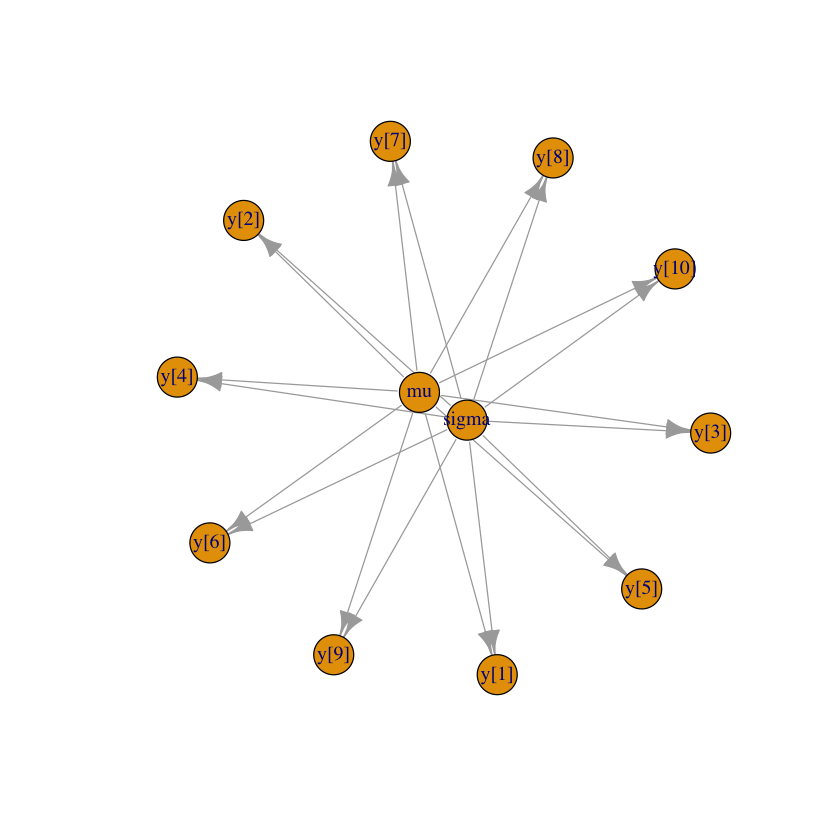

In [18]:
library(igraph)
plot(myModel$getGraph())

In [19]:
myData <- rnorm(10, mean = 12, sd = 2)

In [20]:
myModel$setData(list(y = myData))

In [21]:
myModel$setInits(list(mu = 0, sigma = 1))

In [22]:
myMCMC <- buildMCMC(myModel)

In [23]:
compiled <- compileNimble(myModel, myMCMC)

compiling... this may take a minute. Use 'showCompilerOutput = TRUE' to see C++ compiler details.
compilation finished.


In [24]:
compiled$myMCMC$run(10000)

|-------------|-------------|-------------|-------------|
|-------------------------------------------------------|


NULL

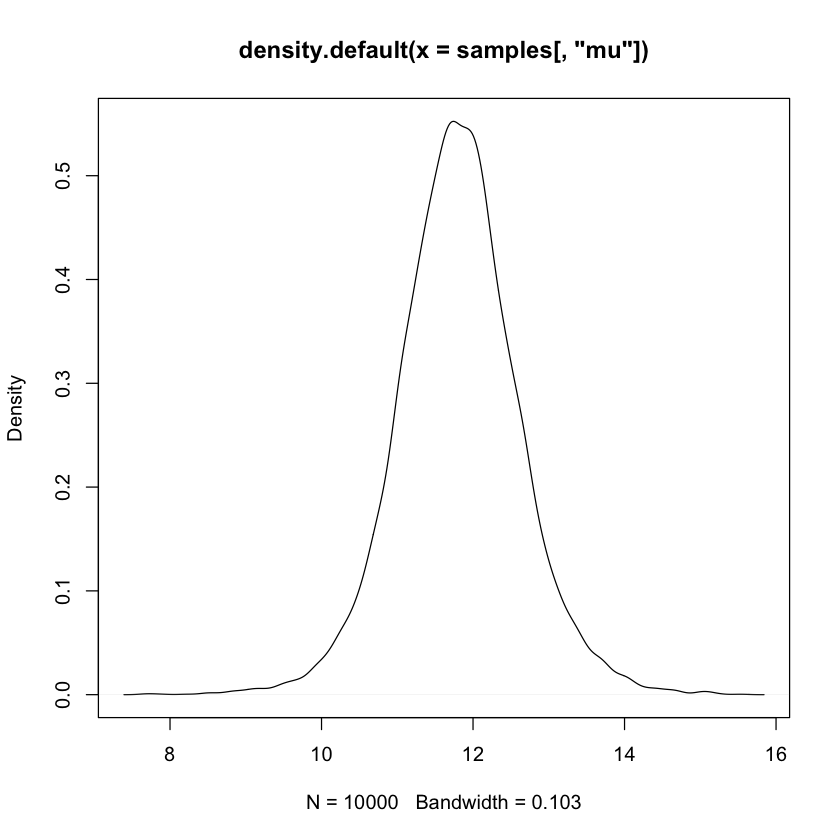

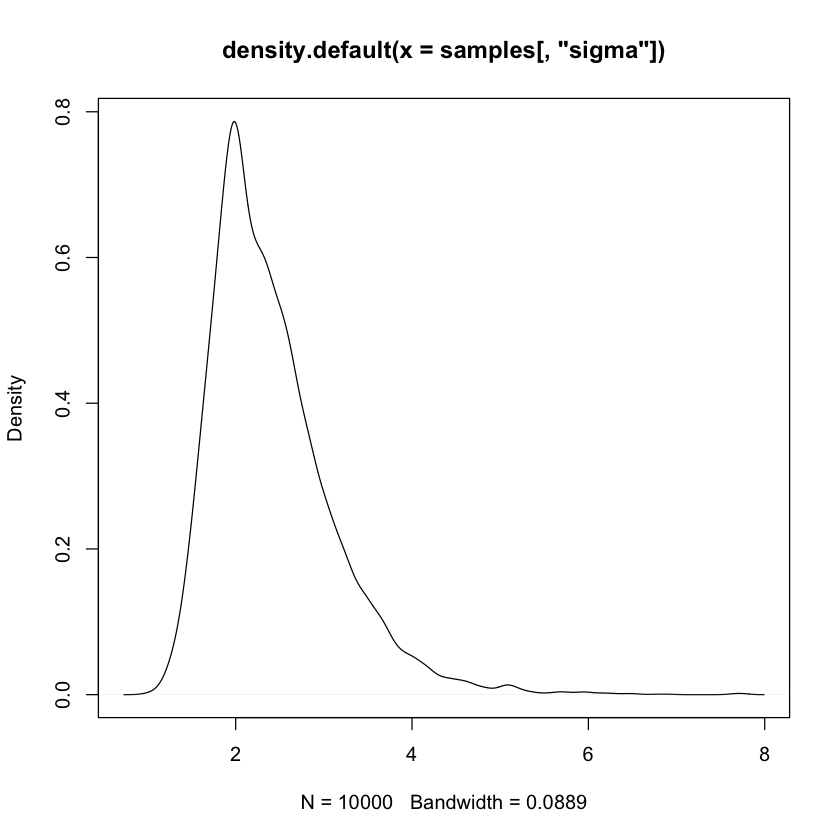

In [10]:
samples <- as.matrix(compiled$myMCMC$mvSamples)
plot(density(samples[,'mu']))
plot(density(samples[,'sigma']))


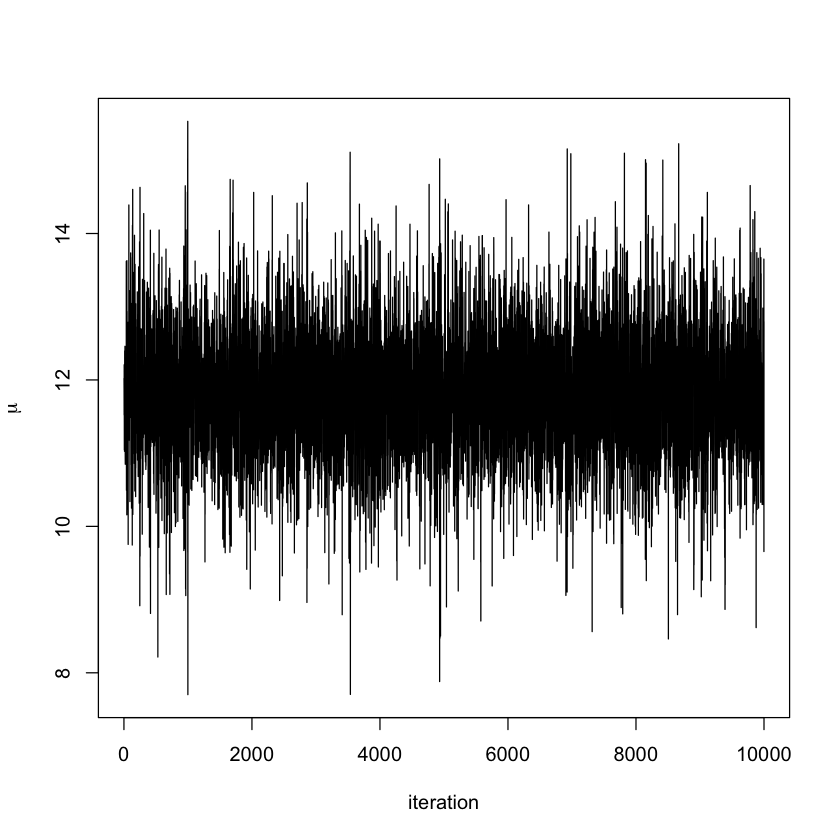

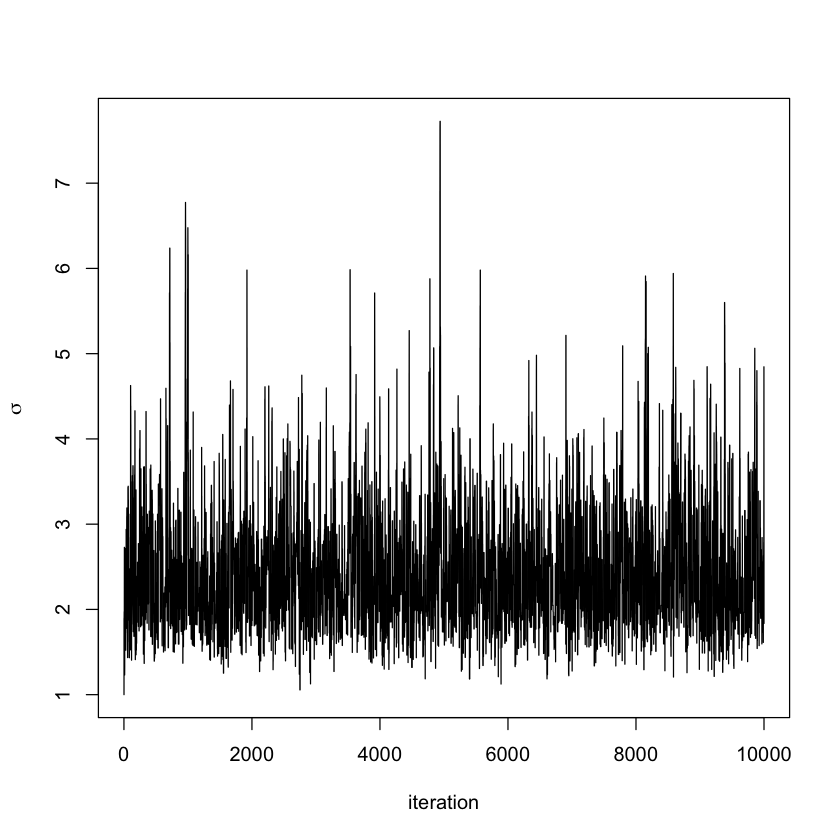

In [40]:
plot(samples[ , 'mu'], type = 'l', xlab = 'iteration',  ylab = expression(mu))
plot(samples[ , 'sigma'], type = 'l', xlab = 'iteration', ylab = expression(sigma))

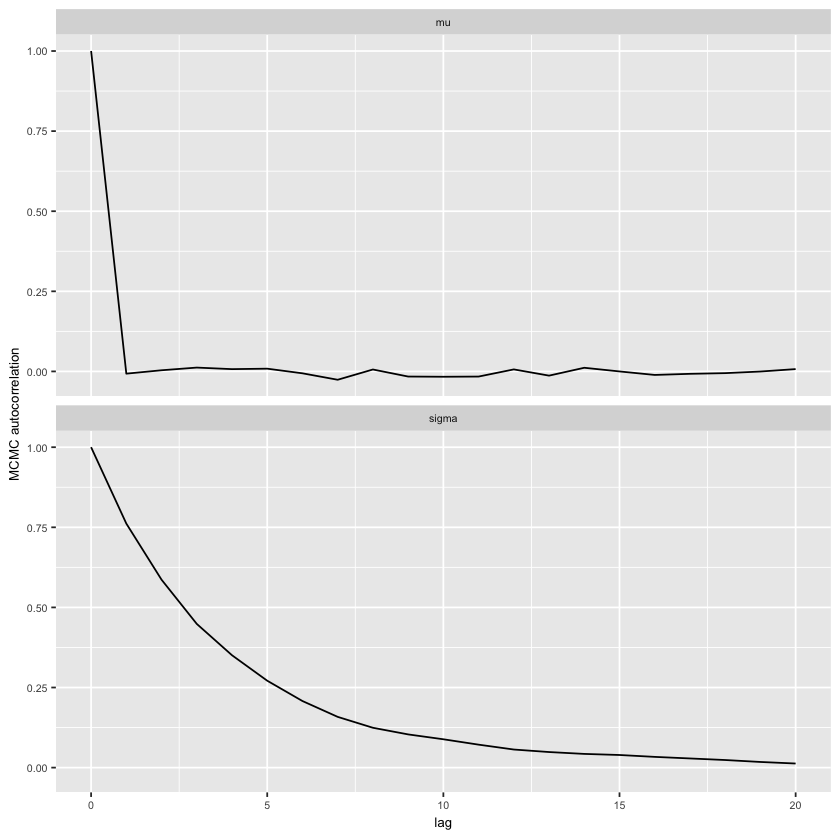

In [41]:
## Figure showing ACFs
acf1 <- with(acf(samples[, 'mu'], plot = FALSE), data.frame(lag, acf)) ## plot autocorrelation of mu sample
acf1$param <- 'mu'
acf2 <- with(acf(samples[, 'sigma'], plot = FALSE), data.frame(lag, acf))
acf2$param <- 'sigma'

acfall <- do.call('rbind', list(acf1, acf2))
acfall <- acfall[acfall$lag <= 20, ]

## line plot version
acfplot <- ggplot(data=acfall, mapping=aes(x=lag, y=acf)) +
    geom_line(stat = "identity", position = "identity") + facet_wrap(~param, ncol = 1)  + theme(legend.position="top", legend.title = element_blank(), text = element_text(size = 8)) + ylab('MCMC autocorrelation')               
print(acfplot)


In [36]:
pdf("/Users/blaine-mooers/Documents/Databases/LaTexWorkbench/BeamerSlideshows/2016Dec6orNov1_SCUG/mu.pdf",width = 4, height = 3.5)
plot(density(samples[,'mu']))
dev.off()

pdf 
  2

In [37]:
pdf("/Users/blaine-mooers/Documents/Databases/LaTexWorkbench/BeamerSlideshows/2016Dec6orNov1_SCUG/sigma.pdf",width = 4, height = 3.5)
plot(density(samples[,'sigma']))
dev.off()

pdf 
  2

In [26]:
library(ggplot2);library(ggExtra)

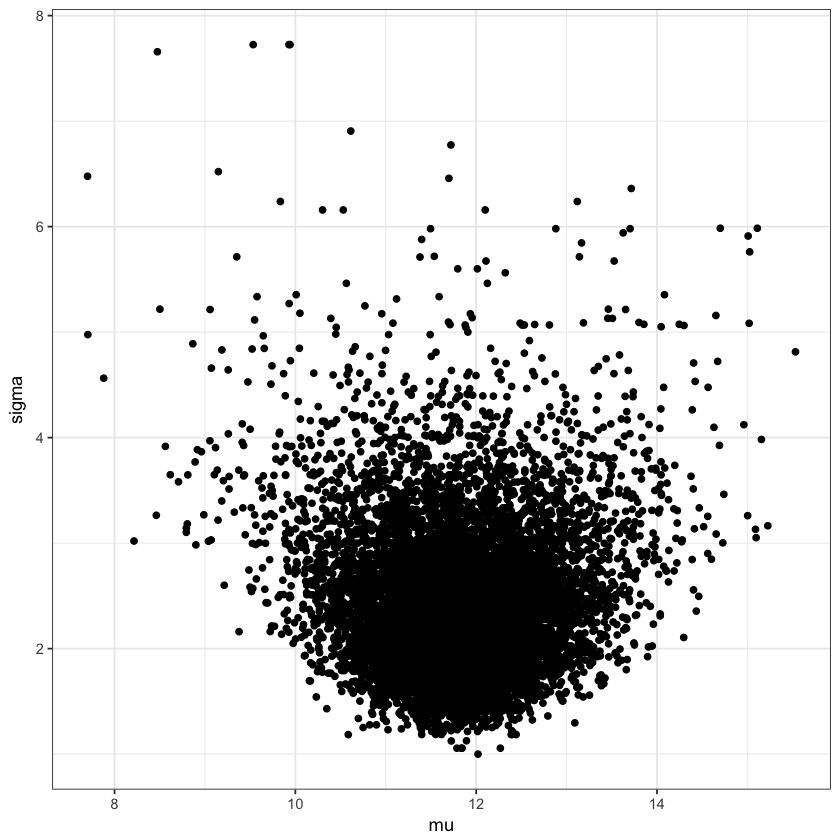

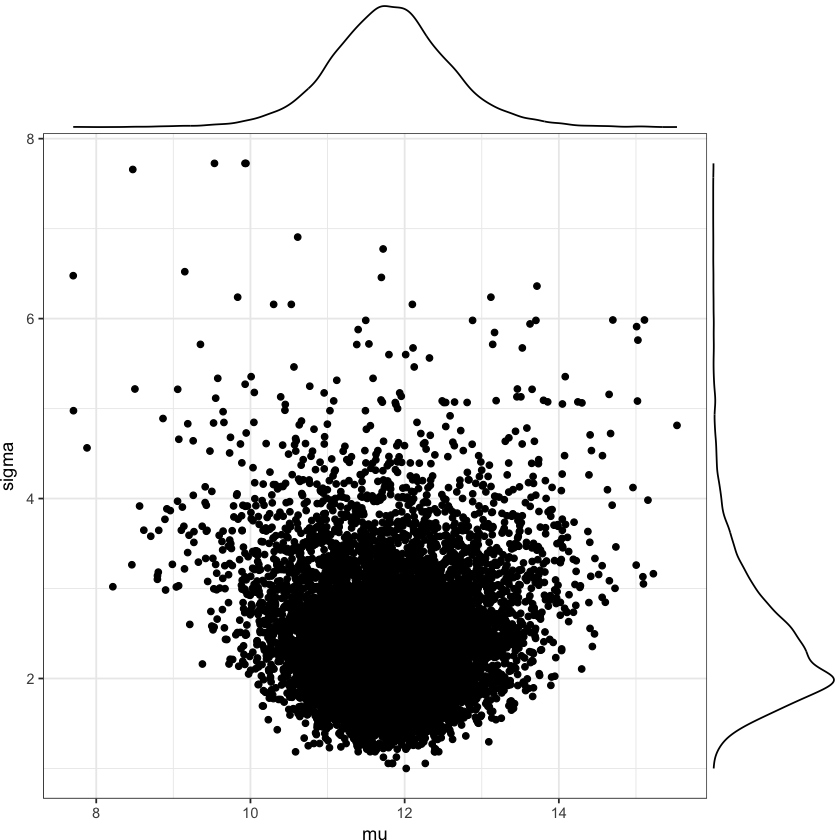

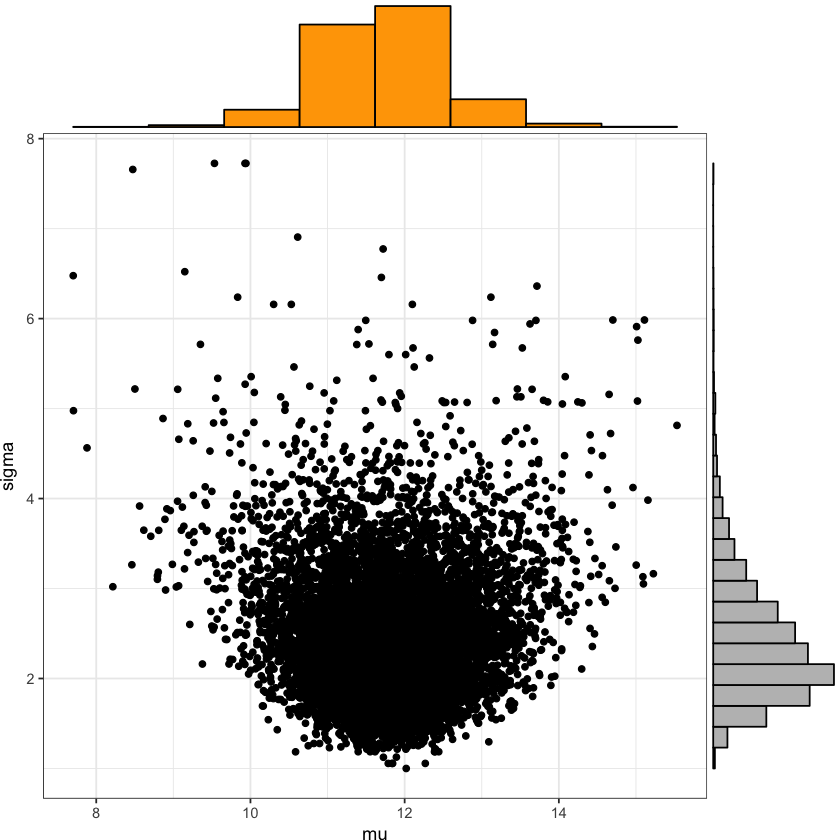

In [38]:
df1 <- data.frame(mu=samples[,'mu'], sigma=samples[,'sigma'])
(p1 <- ggplot(df1, aes(mu, sigma)) + geom_point() + theme_bw())
ggMarginal(p1)
ggMarginal(p1, type = "histogram", xparams = list(binwidth = 1, fill = "orange"))

# Example of using a lifted node.

The 'lifted_d1_over_sqrt_oPtau_cP' is the ``lifted node''. It is the precision used in BUGS and JAGS. The default is the standard deviation in NIMBLE. The lifted node is an inserted node. 

In [26]:
library(nimble)
precCode <- nimbleCode({
for(i in 1:n) 
      y[i] ~ dnorm(0, tau)
tau ~ dgamma(1, 1)
})
precModel <- nimbleModel(precCode, inits = list(tau = 100),
          constants = list(n = 10))
precModel$getNodeNames()

defining model...
building model...
setting data and initial values...
running calculate on model (any error reports that follow may simply reflect missing values in model variables) ... 
checking model sizes and dimensions... note that missing values (NAs) or non-finite values were found in model variables: y. This is not an error, but some or all variables may need to be initialized for certain algorithms to operate properly.
model building finished.


[1] "tau"                          "lifted_d1_over_sqrt_oPtau_cP"
 [3] "y[1]"                         "y[2]"                        
 [5] "y[3]"                         "y[4]"                        
 [7] "y[5]"                         "y[6]"                        
 [9] "y[7]"                         "y[8]"                        
[11] "y[9]"                         "y[10]"

In [27]:
library(igraph)

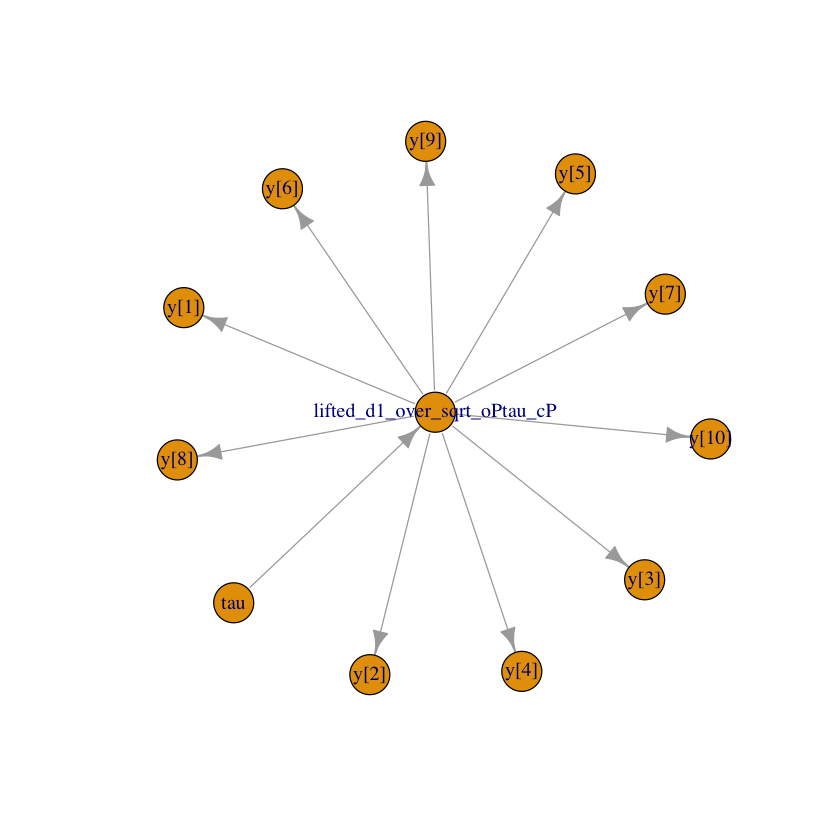

In [28]:
plot(precModel$getGraph())

### It is essential to run calculate to ensure that the lifted node is used correctly.

In [29]:
precModel$tau <- 0.0001
precModel$calculate(precModel$getDependencies('tau'))
precModel$simulate('y')
precModel$y

[1] NA

[1]   0.9328592 -94.3885044 -81.6069138 -74.5079458  21.4096195 228.2991324
 [7] 118.3772613   7.2893695 -72.8518645  81.6288717

In [30]:
precModel$lifted_d1_over_sqrt_oPtau_cP

[1] 100

## If one skips the calculate step and assumes the nodes are only those that appear in the BUGS code, one may not get correct results. {This is as clear as mud to me!}

In [31]:
precModel$tau <- 0.0001
precModel$simulate('y')
precModel$y

[1] -219.356249   -7.375634   -1.209123 -131.009910  214.329541 -113.863642
 [7]  -76.829829   63.933300 -149.141110   79.802653

In [32]:
precModel$lifted_d1_over_sqrt_oPtau_cP

[1] 100

Whoops, y was simulated based on the value of the lifted node, which was not updated based on the new value of tau. That's why the y values are close to their mean of zero even though tau is very small.

In [5]:
set.seed(0)

# Code for the pump model and data from the classic WinBUGS examples

In [6]:
pumpCode <- nimbleCode({ 
  for (i in 1:N){
      theta[i] ~ dgamma(alpha,beta);
      lambda[i] <- theta[i]*t[i];
      x[i] ~ dpois(lambda[i])
  }
  alpha ~ dexp(1.0);
  beta ~ dgamma(0.1,1.0);
})

pumpConsts <- list(N = 10,
               t = c(94.3, 15.7, 62.9, 126, 5.24,
                 31.4, 1.05, 1.05, 2.1, 10.5))

pumpData <- list(x = c(5, 1, 5, 14, 3, 19, 1, 1, 4, 22))

pumpInits <- list(alpha = 1, beta = 1,
              theta = rep(0.1, pumpConsts$N))

### This is an alternate way of putting the model into R code and compiling it. This block is in Markdown and was not run.

Data and initial values (inits) do not need to be provided when the model is created, but it is convenient to do so.


In [7]:
pumpModel <- nimbleModel(code = pumpCode, name = 'pump', constants = pumpConsts,
                    data = pumpData, inits = pumpInits)

defining model...
building model...
setting data and initial values...
running calculate on model (any error reports that follow may simply reflect missing values in model variables) ... 
checking model sizes and dimensions...
model building finished.


The calculate() function initializes all log probability and deterministic node calculations. The compileNimble() function converts the model to C++ code and compiles it.

In [10]:
calculate(pumpModel, pumpModel$getDependencies(c('alpha', 'beta'), determOnly = TRUE))
nimbleOptions(showCompilerOutput = TRUE)
CpumpModel <- compileNimble(pumpModel)

[1] 0

compiling... this may take a minute. On some systems there may be some compiler warnings that can be safely ignored.
compilation finished.


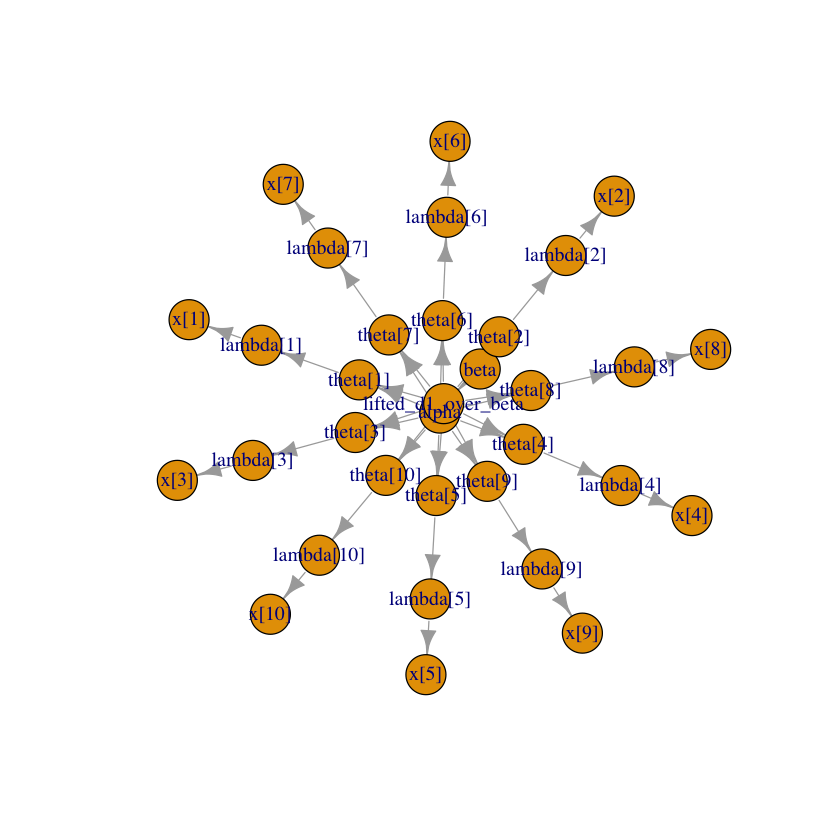

In [11]:
plot(pumpModel$getGraph())

Now we are ready to start the importance sampling example

In [44]:
importanceSample <- nimbleFunction(
    setup = function(model, sampleNodes, mvSample) {
        calculationNodes <- model$getDependencies(sampleNodes)
    },
    run = function(simulatedLogProbs = double(1)) {
        ans <- 0.
        for(i in 1:getsize(mvSample)) {
            copy(from = mvSample, to = model, nodes = sampleNodes, row = i)
            logProbModel <- calculate(model, calculationNodes)
            if(!is.nan(logProbModel)) ans <- ans + exp(logProbModel - simulatedLogProbs[i])
        }
        return(ans/getsize(mvSample))
        returnType(double(0))
    }
    )

ISsample <- modelValues(pumpModel, 1000)
## specialize to setup arguments:
pumpIS <- importanceSample(model = pumpModel, sampleNodes = 'theta[1:3]', ISsample)
## look at results of specialization:
pumpIS$calculationNodes

[1] "theta[1]"  "theta[2]"  "theta[3]"  "lambda[1]" "lambda[2]" "lambda[3]"
[7] "x[1]"      "x[2]"      "x[3]"

In [45]:
sample <- matrix(0, nrow = 1000, ncol = 10)
## For illustration we simulate from the prior.  This is arbitrary: the point is to show how the computations are set up.
sample[,1:3] <- rgamma(3000, 0.1, 1.0)
logProb_sample <- rowSums(dgamma(sample[,1:3], 0.1, 1.0))
## put sample matrix into ISsample modelValues object
Rmatrix2mvOneVar(sample, ISsample, 'theta', 1000L)
## look at contents of ISsample
ISsample[["theta"]][[1]]
## or, equivalently
ISsample["theta", 1]

[1] 4.823447e-01 9.962115e-03 1.456242e-05 0.000000e+00 0.000000e+00
 [6] 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00

[1] 4.823447e-01 9.962115e-03 1.456242e-05 0.000000e+00 0.000000e+00
 [6] 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00

In [46]:
## Run the uncompiled version (executes in R)
pumpIS$run(logProb_sample)

[1] 1.802441e-07

In [47]:
## compile it
CpumpIS <- compileNimble(pumpIS, project = pumpModel)
## Run the compiled version (executes using compiled C++)
CpumpIS$run(logProb_sample) ## This returns the same answer as running it in R


compiling... this may take a minute. Use nimbleOptions(showCompilerOutput = TRUE) to see C++ compiler details.
compilation finished.


[1] 1.802441e-07

# Metropolis-Hastings example


In statistics and in statistical physics, the Metropolis–Hastings algorithm is a Markov chain Monte Carlo (MCMC) method for obtaining a sequence of random samples from a probability distribution for which direct sampling is difficult. 
    \href{https://en.wikipedia.org/wiki/Metropolis%E2%80%93Hastings_algorithm}{wikipedia entry}

In [50]:
simple_MH <- nimbleFunction(
    setup = function(model, currentState, targetNode) {
        calculationNodes  <- model$getDependencies(targetNode)
    },
    run = function(scale = double(0)) {
        logProb_current <- getLogProb(model, calculationNodes)              ## 1
        proposalValue <- rnorm(1, mean = model[[targetNode]], sd = scale)   ## 2
        model[[targetNode]] <<- proposalValue                               ## 3
        logProb_proposal <- calculate(model, calculationNodes)              ## 4
        log_Metropolis_Hastings_ratio <- logProb_proposal - logProb_current ## 5 
        accept <- decide(log_Metropolis_Hastings_ratio)                     ## 6
        if(accept)
            copy(from = model, to = currentState, row = 1,                       ## 7a
                 nodes = calculationNodes, logProb = TRUE)
        else
            copy(from = currentState, to = model, row = 1,                       ## 7b
                 nodes = calculationNodes, logProb = TRUE)
        returnType(integer(0))
        return(accept)
    })

## set up a modelValues
## normally this would be done by an MCMC function that manages multiple samplers
mvState <- modelValues(pumpModel)

## specialize a simple_MH to "theta[4]" of the pumpModel
theta4sampler <- simple_MH(model = pumpModel, currentState = mvState, targetNode = "theta[4]")

## need to reset theta values since they will have whatever was last from the previous example
pumpModel$theta <- pumpInits$theta
calculate(pumpModel) ## updates all calculations
nimCopy(from = pumpModel, nodes = pumpModel$getNodeNames(), to = mvState, rowTo = 1, logProb = TRUE)

## execute in R for any debugging needed
theta4sampler$run(scale = 0.02) ## could generate a warning in R if an illegal proposal is generated, but it is handled correctly

## compile to C++
Ctheta4sampler <- compileNimble(theta4sampler, project = pumpModel)

## execute in compiled C++
Ctheta4sampler$run(scale = 0.02)

[1] -101.362

[1] TRUE

compiling... this may take a minute. Use nimbleOptions(showCompilerOutput = TRUE) to see C++ compiler details.
compilation finished.


[1] 1

# MCMC example

[1]  RW sampler: alpha
[2]  conjugate_dgamma_dgamma sampler: beta,  dep_dgamma: theta[1], theta[2], theta[3], theta[4], theta[5], theta[6], theta[7], theta[8], theta[9], theta[10]
[3]  conjugate_dgamma_dpois sampler: theta[1],  dep_dpois: x[1]
[4]  conjugate_dgamma_dpois sampler: theta[2],  dep_dpois: x[2]
[5]  conjugate_dgamma_dpois sampler: theta[3],  dep_dpois: x[3]
[6]  conjugate_dgamma_dpois sampler: theta[4],  dep_dpois: x[4]
[7]  conjugate_dgamma_dpois sampler: theta[5],  dep_dpois: x[5]
[8]  conjugate_dgamma_dpois sampler: theta[6],  dep_dpois: x[6]
[9]  conjugate_dgamma_dpois sampler: theta[7],  dep_dpois: x[7]
[10] conjugate_dgamma_dpois sampler: theta[8],  dep_dpois: x[8]
[11] conjugate_dgamma_dpois sampler: theta[9],  dep_dpois: x[9]
[12] conjugate_dgamma_dpois sampler: theta[10],  dep_dpois: x[10]


[[1]]
RW sampler: alpha
[[2]]
conjugate_dgamma_dgamma sampler: beta,  dep_dgamma: theta[1], theta[2], theta[3], theta[4], theta[5], theta[6], theta[7], theta[8], theta[9], theta[10]
[[3]]
conjugate_dgamma_dpois sampler: theta[1],  dep_dpois: x[1]
[[4]]
conjugate_dgamma_dpois sampler: theta[2],  dep_dpois: x[2]
[[5]]
conjugate_dgamma_dpois sampler: theta[3],  dep_dpois: x[3]
[[6]]
conjugate_dgamma_dpois sampler: theta[4],  dep_dpois: x[4]
[[7]]
conjugate_dgamma_dpois sampler: theta[5],  dep_dpois: x[5]
[[8]]
conjugate_dgamma_dpois sampler: theta[6],  dep_dpois: x[6]
[[9]]
conjugate_dgamma_dpois sampler: theta[7],  dep_dpois: x[7]
[[10]]
conjugate_dgamma_dpois sampler: theta[8],  dep_dpois: x[8]
[[11]]
conjugate_dgamma_dpois sampler: theta[9],  dep_dpois: x[9]
[[12]]
conjugate_dgamma_dpois sampler: theta[10],  dep_dpois: x[10]

[[1]]
RW sampler: alpha
[[2]]
RW sampler: beta
[[3]]
RW sampler: theta[1]
[[4]]
RW sampler: theta[2]
[[5]]
RW sampler: theta[3]
[[6]]
RW sampler: theta[4]
[[7]]
RW sampler: theta[5]
[[8]]
RW sampler: theta[6]
[[9]]
RW sampler: theta[7]
[[10]]
RW sampler: theta[8]
[[11]]
RW sampler: theta[9]
[[12]]
RW sampler: theta[10]

thin = 1: alpha, beta, theta


compiling... this may take a minute. Use nimbleOptions(showCompilerOutput = TRUE) to see C++ compiler details.
compilation finished.


|-------------|-------------|-------------|-------------|
|-------------------------------------------------------|


alpha     beta 
609.7394 597.6500

compiling... this may take a minute. Use nimbleOptions(showCompilerOutput = TRUE) to see C++ compiler details.
compilation finished.


|-------------|-------------|-------------|-------------|
|-------------------------------------------------------|


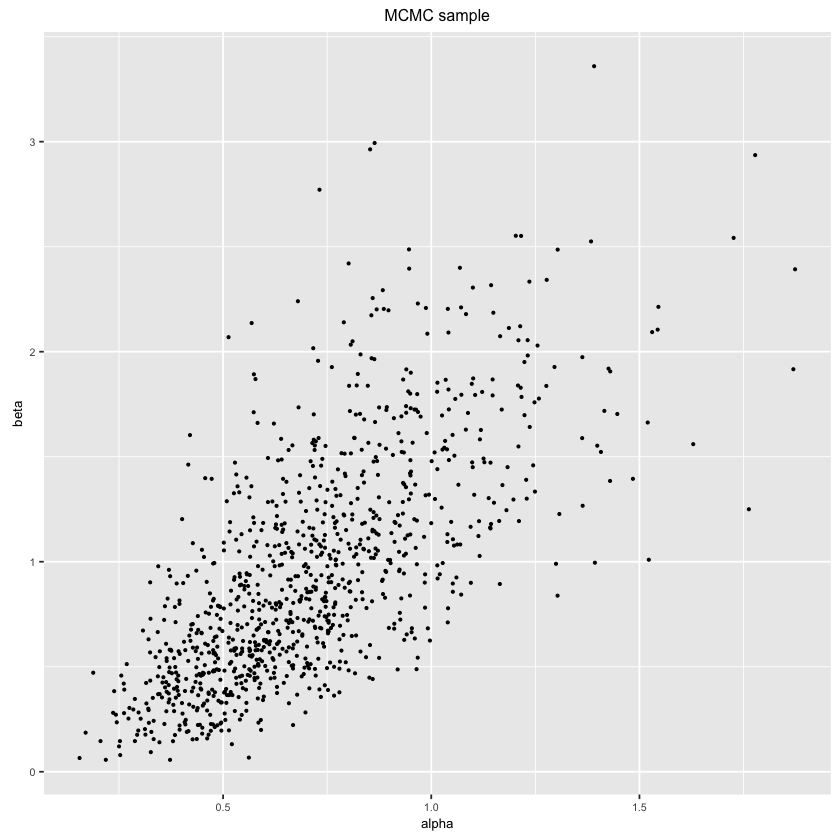

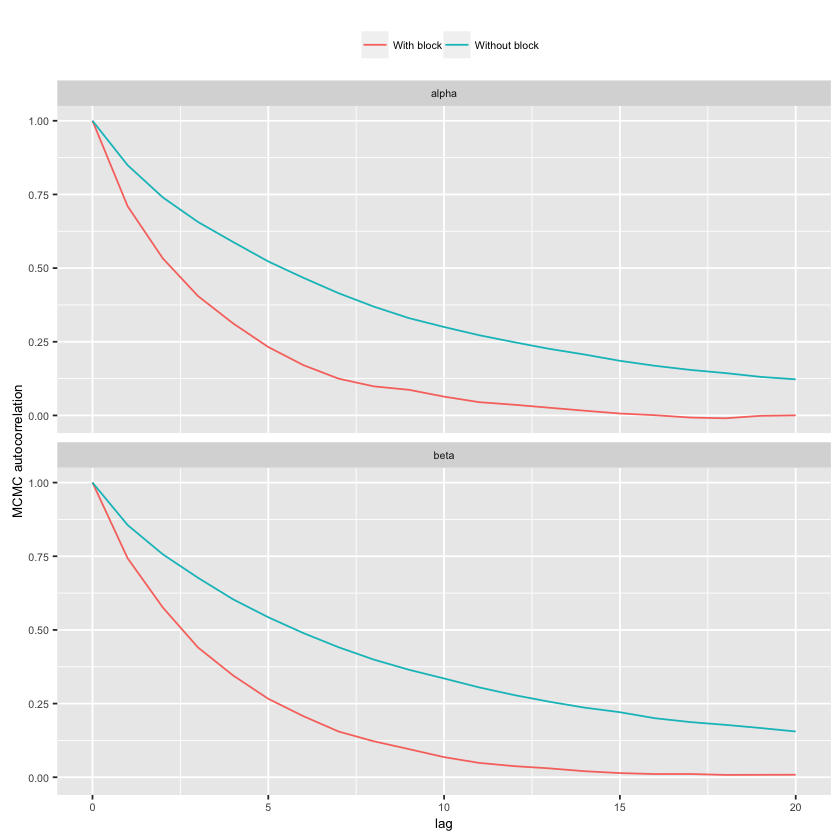

Loading required package: grid


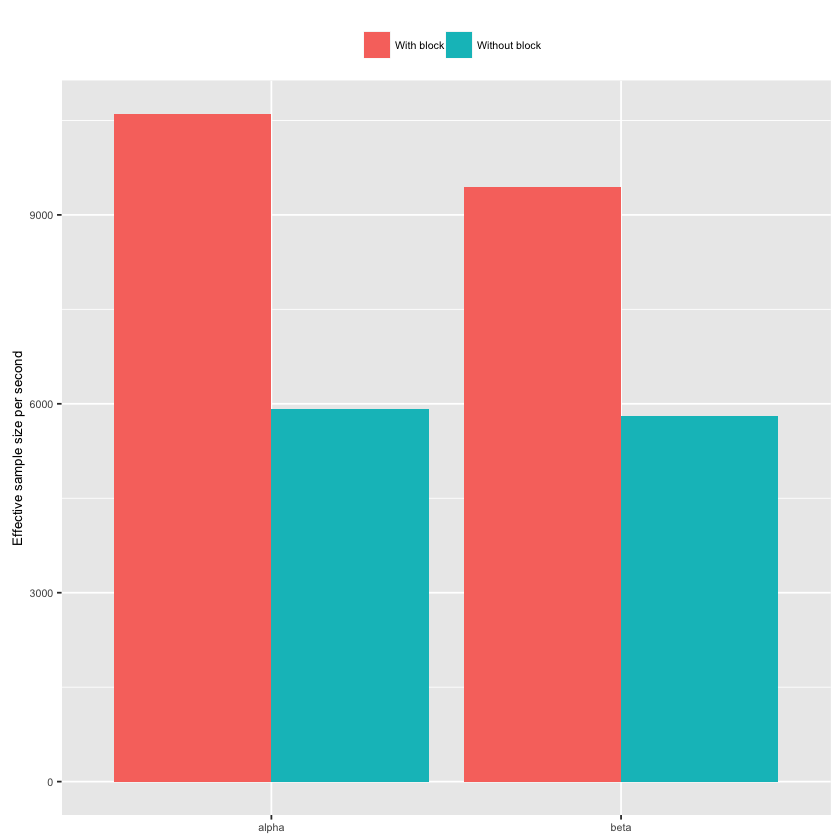

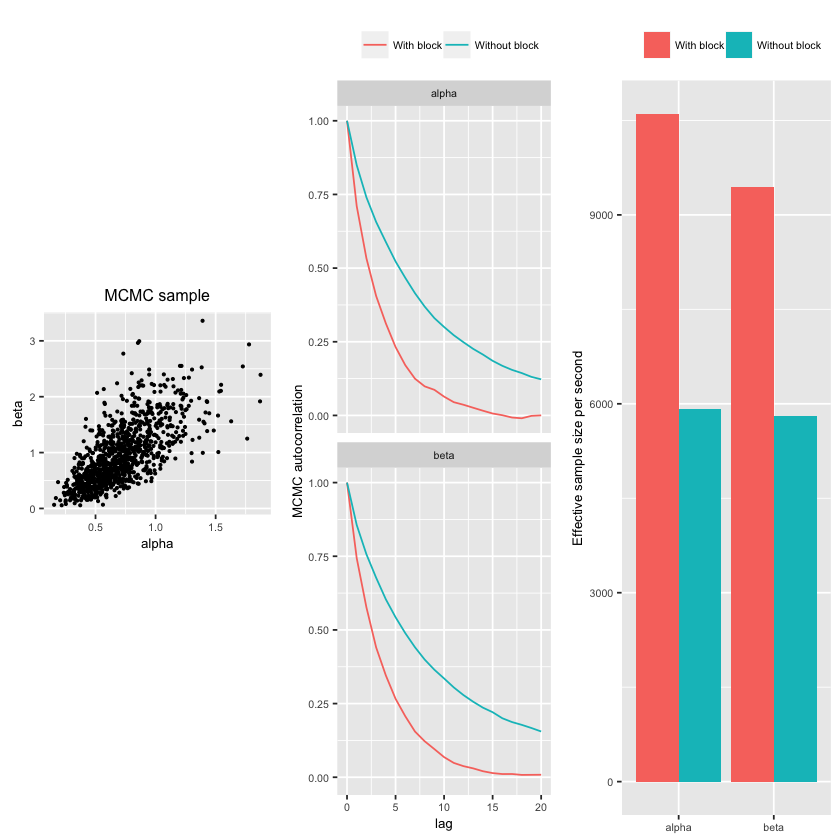

In [51]:
library(coda)

pumpSpec <- configureMCMC(pumpModel, print = TRUE)

## For illustration we will use all adaptive random walk samplers
pumpSpec$getSamplers()
pumpSpec$removeSamplers(2:12)
rwNodes <- pumpModel$getNodeNames()[c(2, 4:13)]
for(rwN in rwNodes) pumpSpec$addSampler(target = rwN, type = 'RW', print = FALSE)
pumpSpec$getSamplers()

pumpSpec$addMonitors(c('alpha', 'beta', 'theta'))

pumpMCMC1 <- buildMCMC(pumpSpec)
CpumpMCMC1 <- compileNimble(pumpMCMC1, project = pumpModel)

niter <- 10000
set.seed(0)
time1 <- system.time(CpumpMCMC1$run(niter))

samples1 <- as.matrix(CpumpMCMC1$mvSamples)
effectiveSize(samples1[,c('alpha', 'beta')])
timer1 <- effectiveSize(samples1[,c('alpha', 'beta')]) /  time1[['elapsed']]

## Now we will add a block sampler for alpha and beta
pumpSpec$addSampler(target = c("alpha", "beta"), type = 'RW_block', control = list(adaptInterval = 100))

pumpMCMC2 <- buildMCMC(pumpSpec)

# need to reset the nimbleFunctions in order to add the new MCMC
CpumpMCMC2 <- compileNimble(pumpMCMC2, project  = pumpModel, resetFunctions = TRUE)

set.seed(0);
time2 <- system.time(CpumpMCMC2$run(niter))
samples2 <- as.matrix(CpumpMCMC2$mvSamples)
timer2 <- effectiveSize(samples2[, c('alpha', 'beta')]) / time2[['elapsed']]

##### Make figure 2
library(ggplot2)

## beta ~ alpha scatterplot
iPlot <- seq(1, 10000, by = 10)
p1 <- ggplot(data.frame(x = samples1[iPlot, 'alpha'], y = samples1[iPlot,'beta']), aes(x = x, y = y)) + xlab('alpha') + ylab('beta') + labs(title = 'MCMC sample') + geom_point(size = 0.5) + theme(text = element_text(size = 8))
print(p1)

## Figure showing ACFs
acf1 <- with(acf(samples1[, 'alpha'], plot = FALSE), data.frame(lag, acf)) ## plot autocorrelation of alpha sample
acf1$block <- 'Without block'
acf1$param <- 'alpha'
acf2 <- with(acf(samples2[, 'alpha'], plot = FALSE), data.frame(lag, acf))
acf2$block <- 'With block'
acf2$param <- 'alpha'

acf1b <- with(acf(samples1[, 'beta'], plot = FALSE), data.frame(lag, acf)) ## plot autocorrelation of alpha sample
acf1b$block <- 'Without block'
acf1b$param <- 'beta'

acf2b <- with(acf(samples2[, 'beta'], plot = FALSE), data.frame(lag, acf))
acf2b$block <- 'With block'
acf2b$param <- 'beta'

acfall <- do.call('rbind', list(acf1, acf2, acf1b, acf2b))
acfall <- acfall[acfall$lag <= 20, ]

## bar plot version
## acfplot <- ggplot(data=acfall, mapping=aes(x=lag, y=acf, fill = block)) +
##     geom_bar(stat = "identity", position = "dodge") + facet_grid(param ~ .)  + theme(legend.position="top", legend.title = element_blank(), text = element_text(size = 8)) + ylab('MCMC autocorrelation')               
## print(acfplot)

## line plot version
acfplot <- ggplot(data=acfall, mapping=aes(x=lag, y=acf, color = block)) +
    geom_line(stat = "identity", position = "identity") + facet_wrap(~param, ncol = 1)  + theme(legend.position="top", legend.title = element_blank(), text = element_text(size = 8)) + ylab('MCMC autocorrelation')               
print(acfplot)

## effective sample size per second
timers <- data.frame(block = rep(c('Without block', 'With block'), each = 2),
                     param = rep(c('alpha','beta'), 2),
                     ESSperTime = c(timer1, timer2))
timerplot <- ggplot(data = timers, mapping = aes(x=param, y = ESSperTime, fill = block)) +
    geom_bar(stat = 'identity', position = 'dodge') + theme(axis.title.x = element_blank()) +
     ylab('Effective sample size per second') + theme(legend.position="top", legend.title = element_blank(), text = element_text(size = 8))                 # Set y-axis label

timerplot

## compose the figure from components
require(grid)
## optional if you want pdf output
## pdf('Fig2.pdf', width = 6.5, height = 4)
grid.newpage()
pushViewport(viewport(layout = grid.layout(1, 3)))
pushViewport(viewport(layout.pos.row = 1, layout.pos.col = 1))
print(p1, vp = viewport(w = unit(1, "snpc"), h = unit(1, "snpc")))
popViewport()
print(acfplot, vp = viewport(layout.pos.row = 1, layout.pos.col = 2))
print(timerplot, vp = viewport(layout.pos.row = 1, layout.pos.co = 3))
## do this if you did the pdf(...) call above
## dev.off()


# mcmcPUMP

defining model...
building model...
setting data and initial values...
running calculate on model (any error reports that follow may simply reflect missing values in model variables) ... 
checking model sizes and dimensions...
model building finished.
compiling... this may take a minute. On some systems there may be some compiler warnings that can be safely ignored.
compilation finished.
compiling... this may take a minute. On some systems there may be some compiler warnings that can be safely ignored.
compilation finished.


|-------------|-------------|-------------|-------------|
|-------------------------------------------------------|


NULL

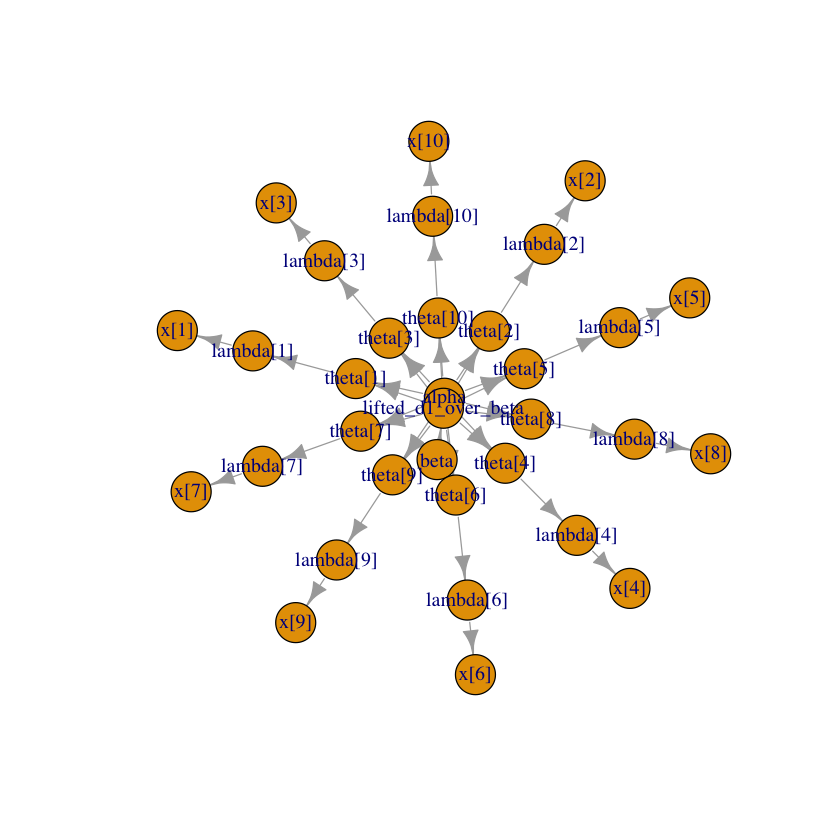

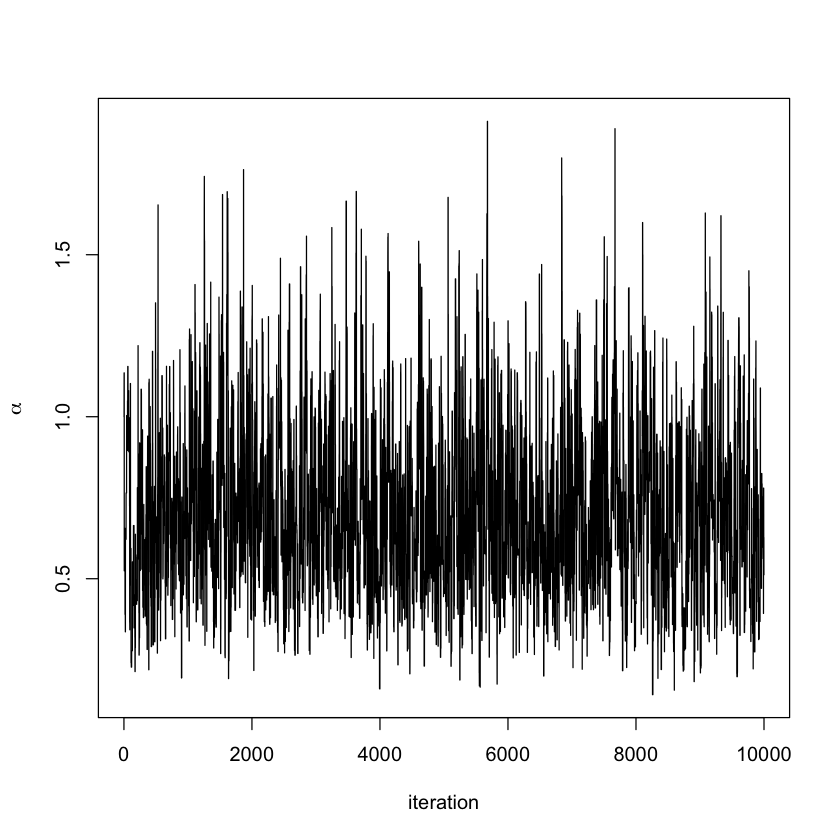

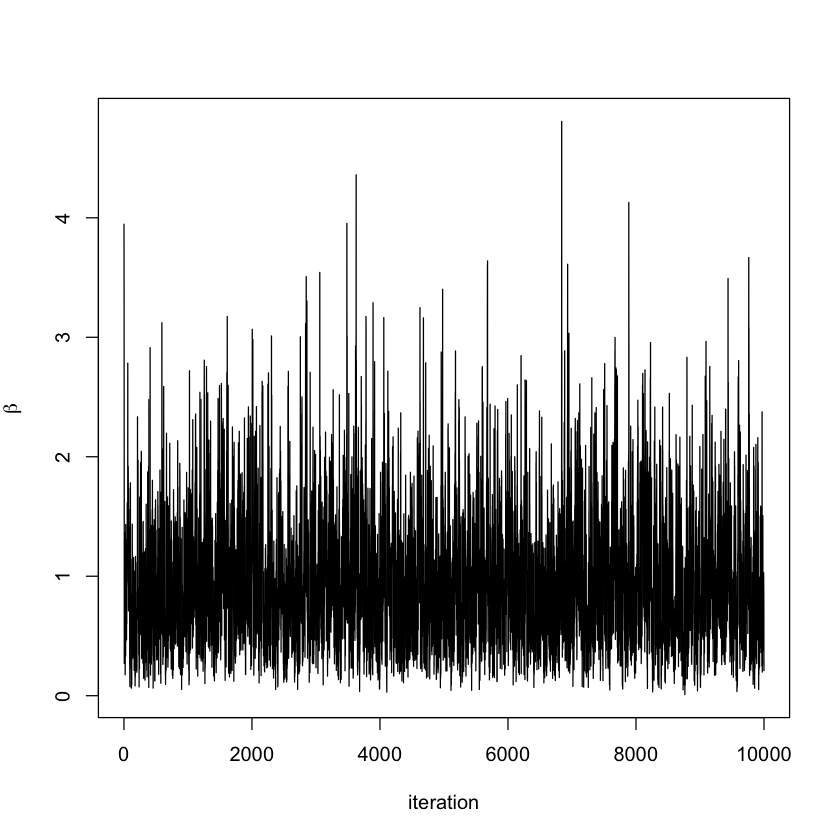

In [46]:
library(nimble)
pumpCode <- nimbleCode({for (i in 1:N){theta[i] ~ dgamma(alpha,beta);lambda[i] <- theta[i]*t[i];x[i] ~ dpois(lambda[i])};alpha ~ dexp(1.0);beta ~ dgamma(0.1,1.0)})

pumpConsts <- list(N = 10,t = c(94.3, 15.7, 62.9, 126, 5.24,31.4, 1.05, 1.05, 2.1, 10.5))

pumpData <- list(x = c(5, 1, 5, 14, 3, 19, 1, 1, 4, 22))

pumpInits <- list(alpha = 1, beta = 1,theta = rep(0.1, pumpConsts$N))

pump <- nimbleModel(code = pumpCode, name = 'pump', constants = pumpConsts,data = pumpData, inits = pumpInits)
plot(pump$graph)
                    
pumpMCMC <- buildMCMC(pump)

Cpump <- compileNimble(pump);CpumpMCMC <- compileNimble(pumpMCMC, project = pump)

CpumpMCMC$run(10000);MCMCsamples <- as.matrix(CpumpMCMC$mvSamples);

plot(MCMCsamples[ , 'alpha'], type = 'l', xlab = 'iteration',  ylab = expression(alpha))
plot(MCMCsamples[ , 'beta'], type = 'l', xlab = 'iteration', ylab = expression(beta))

# MEM example

## I am not getting any output

In [ ]:
## MCEM example
box = list( list(c('alpha','beta'), c(0, Inf)))
box
pump2 <- pumpModel$newModel() ## make a new copy of the model
pump2
## buildMCEM source code is in the R/MCEM_build.R file of the NIMBLE package source code.
pumpMCEM <- buildMCEM(model = pump2, latentNodes = 'theta[1:10]', boxConstraints = box)
pumpMLE <- pumpMCEM() 
# Note: buildMCEM returns an R function that contains a
# nimbleFunction rather than a nimbleFunction itself. That is why
# pumpMCEM() is used instead of pumpMCEM$run().
## Note 2: This demonstrates the programming flexibility of NIMBLE.
## 
## For illustration this version does not monitor convergence but simply runs
## for a fixed number of iterations (20)
pumpMCEM()
?pumpMLE


# Use the command below to run a specific example in the BUGS library

classicDyesModel <- readBUGSmodel('dyes', dir = getBUGSexampleDir('dyes'))

This link has the R code for the three volumes of BUGS examples: https://github.com/nimble-dev/nimble/tree/devel/packages/nimble/inst/classic-bugs. You can use the list of names here to find the name of the example that you want to load with the above command.

# User defined distribution

To illustrate, suppose that NIMBLE did not provide an exponential distribution. Here`s what you would do to code up your own exponential distribution and make it available in BUGS code.

First we write nimbleFunctions for the density and simulation functions. Note the naming is analogous to how probability distributions are handled in R. 


In [35]:
dmyexp <- nimbleFunction(
    run = function(x = double(0), rate = double(0, default = 1), 
        log = integer(0, default = 0)) {
        returnType(double(0))
        logProb <- log(rate) - x*rate
        if(log) return(logProb)
        else return(exp(logProb)) 
    })

rmyexp <- nimbleFunction(
    run = function(n = integer(0), rate = double(0, default = 1)) {
        returnType(double(0))
        if(n != 1) print("rmyexp only allows n = 1; using n = 1.")
        dev <- runif(1)
        return(-log(1-dev) / rate)
    })

In [36]:
assign('dmyexp', dmyexp, .GlobalEnv)
assign('rmyexp', rmyexp, .GlobalEnv)

The User Manual also shows how you could write CDF ('p') and inverse CDF ('q') such that you could make use of truncation with your distribution, but for standard usage all you need is the density ('d') and simulation ('r') functions.

# Registering your new distribution

In [37]:
registerDistributions(list(
        dmyexp = list(
               BUGSdist = "dmyexp(rate, scale)",
               Rdist = "dmyexp(rate = 1/scale)",
               altParams = c("scale = 1/rate", "mean = 1/rate"),
               pqAvail = FALSE,
               range = c(0, Inf)
               )))

This makes NIMBLE aware of the distribution as a BUGS distribution. 

Comments: 

  - If you want to allow users to use different parameterizations for the distribution, you can do this via the *Rdist* element. Here we allow use of *scale*, with the conversion from *scale* to the canonical *rate* specified.
  - The *altParams* information can be used in NIMBLE's MCMC conjugacy system and sequential Monte Carlo system but is not required.

# Using the distribution

defining model...
building model...
setting data and initial values...
running calculate on model (any error reports that follow may simply reflect missing values in model variables) ... 
checking model sizes and dimensions... note that missing values (NAs) or non-finite values were found in model variables: lifted_d1_over_mu, mu. This is not an error, but some or all variables may need to be initialized for certain algorithms to operate properly.
model building finished.


[[1]]
RW sampler: mu

|-------------|-------------|-------------|-------------|
|---------------------

Warning message:
In log(rate): NaNs produced

--------------------------------

Warning message:
In log(rate): NaNs produced

--|


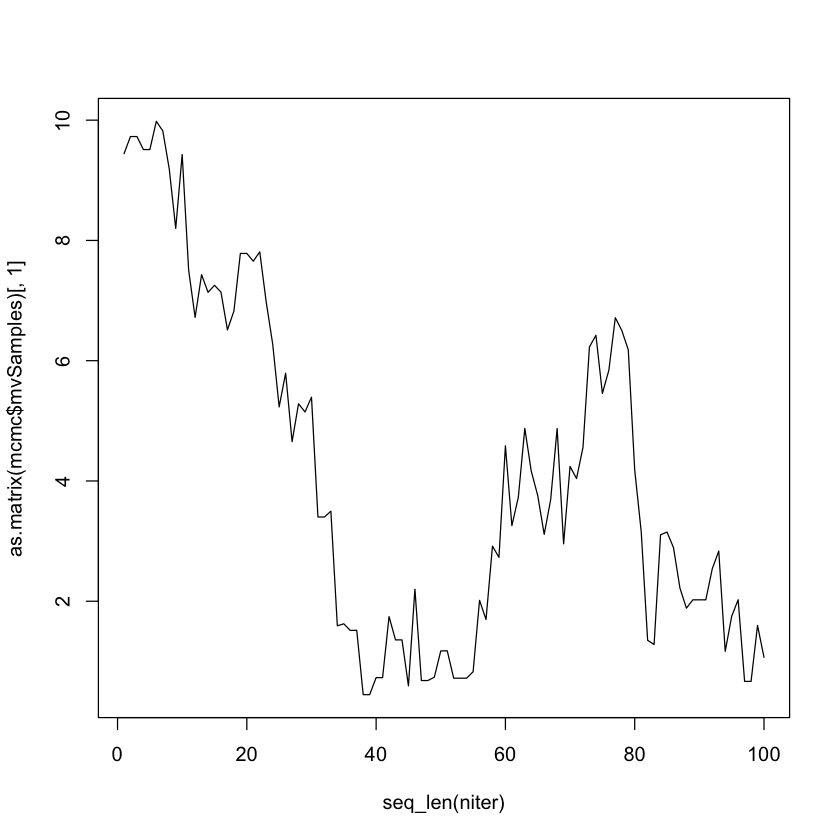

In [38]:
code <- nimbleCode({
y ~ dmyexp(scale = mu)
mu ~ dunif(0, 10)
})
m <- nimbleModel(code, data = list(y = 1.2))
mcmcConf <- configureMCMC(m)
mcmcConf$getSamplers()
mcmc <- buildMCMC(mcmcConf)
niter <- 100
mcmc$run(niter)
plot(seq_len(niter), as.matrix(mcmc$mvSamples)[,1], type = 'l')

# A more interesting example

While educational, the exponential example is not particularly interesting given NIMBLE already provides that distribution.  Let's consider an example where using a user-defined distribution can improve MCMC performance (run time and sampling efficiency).

When working with multinomial data, the Dirichlet distribution can be used to relate the probability vector in the multinomial to covariates and to induce over-dispersion.

One context in which this comes up is topic modeling. You might have textual data from multiple documents, with each document being about a topic. The probabilities of words in each document in a topic can be represented as being a sample from a Dirichlet distribution for that topic.  

Another context is modeling of use of discrete resources by organisms.

# Basic topic model 

A (very) basic model might look like this.

<center><img src="figures/topicModel.jpg"></center>


In [40]:
code <- nimbleCode({
for(i in 1:n) {
  # likelihood - word counts
  y[i, 1:K] ~ dmulti(p[i,1:K], N[i])
  # latent process (random effects) - topic model
  p[i, 1:K] ~ ddirch(alpha[topic[i], 1:K])
}
# prior for hyperparameters
for(tp in 1:M)
  for(k in 1:K)
  alpha[tp, k] ~ dunif(0, 100)
})

const <- list(M = 2, K = 4, n = 5, N = rep(1000, 5),
      topic = c(1, 1, 1, 2, 2))
alphaInits <- rbind(c(10, 30, 100, 3), c(12, 15, 15, 8))
m <- nimbleModel(code, constants = const, 
  inits = list(alpha = alphaInits))


defining model...
building model...
setting data and initial values...
running calculate on model (any error reports that follow may simply reflect missing values in model variables) ... 
checking model sizes and dimensions... note that missing values (NAs) or non-finite values were found in model variables: y, p. This is not an error, but some or all variables may need to be initialized for certain algorithms to operate properly.
model building finished.


Note that with those `alpha` values, the third word is very common in topic 1, while in topic 2, the second and third words are equally common. 

In [41]:
set.seed(0)
m$simulate(c('p', 'y'))
m$p
m$y

0.10134517,0.20395284,0.67119748,0.02350452
0.03611284,0.21754372,0.72274784,0.02359560
0.06634704,0.19574573,0.72206440,0.01584282
0.2285117,0.2275938,0.3583437,0.1855508
0.2948676,0.3506231,0.2940282,0.0604811


115,208,660,17
39,197,733,31
68,192,727,13
227,210,377,186
300,343,312,45


# The Dirichlet-multinomial distribution

Those of you familiar with Gibbs sampling may recognize that with a multinomial likelihood and Dirichlet prior, you can analytically integrate over `p[topic, ]` for all topics. This eliminates a layer in the model and should improve MCMC performance by reducing dependence amongst the model parameters and by simply reducing the number of parameters needing to be sampled.

Integrating over the proportions gives the Dirichlet-multinomial distribution, whose [density](https://en.wikipedia.org/wiki/Dirichlet-multinomial_distribution#For_a_multinomial_distribution_over_category_counts) involves a heap of gamma functions. 

# Dirichlet-multinomial nimbleFunctions

Here's how we'd write the density ('d') and simulation ('r') nimbleFunctions for this distribution. 

Note that in this example we have that the random variable and the parameter are one-dimensional arrays (vectors), so we need to indicate that.


In [42]:
ddirchmulti <- nimbleFunction(
            run = function(x = double(1), alpha = double(1), size = double(0),
                log = integer(0, default = 0)) {

                returnType(double(0))
                logProb <- lgamma(size) - sum(lgamma(x)) + 
                        lgamma(sum(alpha)) -
                        sum(lgamma(alpha)) + sum(lgamma(alpha + x)) - 
                        lgamma(sum(alpha) + size)
                if(log) return(logProb)
                        else return(exp(logProb))
})

rdirchmulti <- nimbleFunction(
            run = function(n = integer(0), alpha = double(1), 
                size = double(0)) {

                returnType(double(1))
                if(n != 1) print("rdirchmulti only allows n = 1; using n = 1.")
                p <- rdirch(1, alpha)
                return(rmulti(1, size = size, prob = p))
})

In [43]:
assign('ddirchmulti', ddirchmulti, .GlobalEnv)
assign('rdirchmulti', rdirchmulti, .GlobalEnv)

In [44]:
registerDistributions(list(
        ddirchmulti = list(
        BUGSdist = "ddirchmulti(alpha, size)",
        types = c('value = double(1)', 'alpha = double(1)'))
))

# Using the user-defined distribution

We can now rewrite the topic model as follows. We will not apply this to a real dataset, but one could now use this rewritten model in an algorithm such as MCMC, as in one of the exercises.

In [45]:
code2 <- nimbleCode({
for(i in 1:n)
  # likelihood 
  y[i,1:K] ~ ddirchmulti(alpha[topic[i], 1:K], N[i])
# priors for hyperparameters
for(tp in 1:M)
  for(k in 1:K)
  alpha[tp, k] ~ dunif(0, 100)
})
m2 <- nimbleModel(code2, constants = const,
  inits = list(alpha = alphaInits))
set.seed(0)
m2$simulate('y')
m2$y

defining model...
building model...
setting data and initial values...
running calculate on model (any error reports that follow may simply reflect missing values in model variables) ... 
checking model sizes and dimensions... note that missing values (NAs) or non-finite values were found in model variables: y. This is not an error, but some or all variables may need to be initialized for certain algorithms to operate properly.
model building finished.


99,194,685,22
85,220,682,13
68,205,725,2
250,328,280,142
228,216,407,149


# Final thoughts

In real document analysis, you would want to infer topics for unlabelled documents. This would require having discrete variables be the random (unknown) indices of `alpha` that indicate the unknown topic of each such document, but at the moment, NIMBLE does not allow for random indices. 

Also, a standard model for topic analysis, called *latent Dirichlet allocation*, allows each document to be a mixture of topics. One could expand the code here to allow for that. 

Another kind of useful distribution to define is a zero-inflated distribution, for which there is an example on our [web site](r-nimble.org/examples).


# kSample  Anderson-Darling KS nonparametric test

In [49]:
library(kSamples)
u1 <- c(426, 426, 463, 463,  53,  53, 230, 230, 156,  32,
+     498, 293,  39, 124,  43, 301, 433, 177, 306,  62, 566, 368, 281, 282,
+     440, 152, 151, 277, 549, 100, 482, 142, 140, 101,   8, 519, 130, 513,
+      55, 58, 185,  86, 392, 248, 374, 370, 240, 239, 363, 288, 570, 229,
+     226, 396,  92,  85, 252, 193,  81, 208,  77,  74, 201, 582,  69, 66, 
+     65, 191, 190, 188, 128)

u2 <- c(2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 13, 13, 13, 13,
+     13, 13, 13, 13, 13, 13, 13, 13, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 7,
+     7, 7, 7, 7, 7, 7, 7, 7, 7, 20, 20, 20, 20, 20, 20, 20, 20, 11, 11,
+     11, 11, 11, 11, 11, 11, 12, 12, 12, 12, 12, 12, 12, 12, 21, 21, 21,
+     21, 21, 21, 21, 21, 51, 51, 51, 51, 51, 51, 51, 8, 8, 8, 8, 8, 8, 8,
+     35, 35, 35, 35, 35, 35, 35, 10, 10, 10, 10, 10, 10, 10, 14, 14, 14,
+     14, 14, 14, 14, 42, 42, 42, 42, 42, 42, 36, 36, 36, 36, 36, 36, 34,
+     34, 34, 34, 34, 34, 28, 28, 28, 28, 28, 28, 16, 16, 16, 16, 16, 16,
+     6, 6, 6, 6, 6, 6, 4, 4, 4, 4, 4, 4, 32, 32, 32, 32, 32, 31, 31, 31,
+     31, 31, 5, 5, 5, 5, 5, 40, 40, 40, 40, 40, 39, 39, 39, 39, 39, 9, 9,
+     9, 9, 9, 15, 15, 15, 15, 15, 49, 49, 49, 49, 49, 27, 27, 27, 27, 27,
+     26, 26, 26, 26, 26, 25, 25, 25, 25, 25, 17, 17, 17, 17, 17, 37, 37,
+     37, 37, 46, 46, 46, 46, 62, 62, 62, 62, 33, 33, 33, 33, 24, 24, 24,
+     24, 30, 30, 30, 30, 57, 57, 57, 57, 47, 47, 47, 47, 22, 22, 22, 22,
+     66, 66, 66, 59, 59, 59, 58, 58, 58, 67, 67, 67, 18, 18, 18, 50, 50,
+     50, 48, 48, 48, 19, 19, 19, 23, 23, 23, 60, 60, 60, 53, 53, 55, 55,
+     38, 38, 29, 29, 61, 61, 115, 115, 76, 76, 63, 63, 89, 89, 88, 88,
+     103, 103, 84, 84, 82, 82, 78, 78, 97, 97, 75, 75, 74, 74, 73, 73, 72,
+     72, 71, 71, 70, 70, 68, 68, 64, 64, 151, 132, 134, 136, 146, 148,
+     228, 190, 152, 160, 178, 185, 189, 120, 194, 195, 198, 203, 129, 98,
+     118, 112, 80, 45, 44, 41, 86, 87, 90, 92, 93, 94, 95, 99, 105, 107,
+     108, 238)

nmg <- c(75,2,0,9,7,40,11,1,54,7,38,18,38,2,39,4,22,3,9,40,10,86,11,17,2,15,6,19,58,19,59,1,11,11,7,1,28,20,37,13,5,9,9,37,29,1,3,26,9,3,32,50,2,17,8,37,51,8,16,6,3,37,70,22,92,46,56,2,16,22,29,4,16,19,17,32,6,13,78,3,3,15,4,14,9,30,17,9,19,8,26,20,1,7,11,32,30,1,14,7,17,64,47,10,49,10,1,18,24,10,13,21,1,94,8,1,44,25,2,33,22,25,10,16,19,6,6,23,3,10,20,26,68,5,47,46,23,6,23,19,1,11,16,21,3,20,80,12,62,12,31,28,94,17,9,49,5,26,5,10,2,16,8,13,4,39,32,34,12,5,56,34,5,57,36,33,28,7,6,38,5,12,15,21,20,8,10,15,27,13,14,25,32,13,1,35,43,10,26,49,15,6,30,15,20,23,38,13,33,7,22,4,16,25,17,48,8,8,28,17,6,51,9,38,95,3,11,13,5,4,2,15,20,21,9,31,31,18,4,3,7,26,21,17,17,23,39,5,5,44,18,20,15,11,3,7,32,17,12,21,13,55,50,2,17,6,30,48,11,8,20,12,23,17,15,16,41,51,48,21,2,13,17,2,9,49,6,1,5,24,16,6,14,3,7,1,14,27,19,16,35,13,44,15,4,9,1,27,3,5,85,13,25,30,18,51,1,9,7,41,53,47,21,6,1,10,9,2,17,30,12,48,25,19,24,26,34,30,22,12,49,4,72,40,2,21,1,30,43,3,47,8,33,56,2,9,19,12,26,15,49,16,12,40,26,50,1,22,6,6,10,7,18,31,16,12,8,10,27,24,24,23,48,1,20,10,22,9,13,32,60,1,12,20,2,1,18,3,3,36,28,1,24,4,64,11,31,4,18,18,16,36,42,15,27,6,4,7,41,42,10,35,7,27,6,43,8,1,4,6,14,20,3,25,3,2,1,39,30,48,4,44,26,4,8,19,12,18,6,3,16,1,2,29,210,7,17,26,2,38,28,10,14,37,1,39,17,41,23,49,24,5,15,5,12,5,11,12,19,4,36,6,46,15,12,50,51,28,31,38,1,50,2,30,21,59,2,19,21,63,32,50,12,50,8,4,6,17,25,39,12,11,26,14,14,31,44,9,30,20,61,7,11,44,11,50,27,49,15,6,22,16,4,3,44,14,50,1,17,18,17,2,4,69,12,15,72,16,13,34,71,4,26,44,32,7,3,5,11,11,10,12,8,27,11,4,7,18,51,7,27,6,19,3,23,21,14,10,30,43,14,5,10,10,15,1,41,3,107,62,1,45,14,1,19,91,3,13,4,28,4,52,10,21,17,1,8,13,2,51,58,5,11,60,38,21,11,25,48,16,37,24,51,13,3,4,1,49,13,26,33,1,7,6,2,20,26,1,1,10,29,17,11,62,26,54,64,22,60,7,9,50,14,5,10,20,8,1,22,12,14,17,18,28,14,9,16,31,20,10,15,38,6,27,17,16,11,37,16,49,28,8,29,6,32,48,5,37,7,45,38,6,10,74,4,3,10,2,29,18,6,60,17,13,60,5,3,38,10,67,15,11,21,39,1,45,29,21,15,140,18,8,6,25,28,25,9,27,54,6,4,6,22,60,6,27,25,57,14,13,8,24,16,2,9,163,12,6,61,21,48,13,33,22,15,4,24,17,58,86,50,5,1,19,24,5,58,40,18,15,10,44,21,3,29,9,6,34,13,20,32,4,14,35,2,24,47,5,19,27,3,9,1,41,30,20,66,6,29,9,34,18,20,9,6,43,23,9,27,8,3,8,21,25,23,21,16,18,33,36,9,2,25,11,2,12,2,3,10,9,27,86,3,4,8,13,10,6,13,19,26,17,9,60,32,16,14,15,13,27,14,38,22,34,14,66,33,2,30,1,21,53,21,18,12,11,59,10,6,10,30,21,69,4,12,68,3,20,4,74,13,35,45,3,18,17,10,14,5,26,56,17,6,7,10,13,7,74,2,1,6,18,14,1,9,7,6,26,12,102,59,7,41,4,10,93,7,38,57,24,65,34,39,27,24,30)

out.ad <- ad.test(nmg,u1,u2,method="exact",dist=FALSE,Nsim=1000)
out.ad

Loading required package: SuppDists




 Anderson-Darling k-sample test.

Number of samples:  3
Sample sizes:  926, 71, 364
Number of ties: 1188

Mean of  Anderson-Darling  Criterion: 2
Standard deviation of  Anderson-Darling  Criterion: 1.07551

T.AD = ( Anderson-Darling  Criterion - mean)/sigma

Null Hypothesis: All samples come from a common population.

Based on Nsim = 1000 simulations

              AD  T.AD  asympt. P-value  sim. P-value
version 1: 183.5 168.8       1.006e-104             0
version 2: 183.0 168.4       6.436e-105             0

# BLMR.R

In [ ]:
graphics.off()          # Clears all graphical displays.
rm(list=ls(all=TRUE))   # Removes all variables from memory!

# Get the Bayesian functions into R's working memory:
source("BMLR.R")

# Load the data into R:
dataMat = read.csv( file="BMLRexampleData.csv" )
# Important: The matrix dataMat must have the criterion y in its first column, 
# and the predictors in the subsequent columns!

# Run the Bayesian analysis and put the results in variable named mcmcChain:
mcmcChain = BMLRmcmc( dataMat )

# Plot the posterior distribution and put summary in variable named postInfo:
postInfo = BMLRplot( mcmcChain ) 
# Display the summary on the console:
show(postInfo)


# Another example, using a large N data set:
dataMat = read.csv( file="BMLRexampleLargeNdata.csv" )
mcmcChain = BMLRmcmc( dataMat , numSavedSteps=100000 )
postInfo = BMLRplot( mcmcChain , 
                     ROPEbeta=c(-0.05,0.05) , ROPEbetaDiff=c(-0.05,0.05) ) 
show(postInfo)
